In [23]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn import tree, metrics
from sklearn.model_selection import train_test_split
from io import StringIO 
from IPython.display import Image  
import pydotplus

In [4]:
data = pd.read_csv("bank-full.csv",sep=";")

In [5]:
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


In [7]:
data.shape

(45211, 17)

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [9]:
print("\nMissing values in the dataset:\n", data.isnull().sum())


Missing values in the dataset:
 age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
y            0
dtype: int64


In [11]:
# Mapping dictionaries
mapping_yes_no = {'yes': 1, 'no': 0}
mapping_job = {
    "admin.": 0, "unknown": 1, "unemployed": 2, "management": 3, "housemaid": 4,
    "entrepreneur": 5, "student": 6, "blue-collar": 7, "self-employed": 8,
    "retired": 9, "technician": 10, "services": 11
}
mapping_marital = {"married": 0, "divorced": 1, "single": 2}
mapping_education = {"unknown": 0, "primary": 1, "secondary": 2, "tertiary": 3}
mapping_contact = {"unknown": 0, "telephone": 1, "cellular": 2}
mapping_month = {
    "jan": 1, "feb": 2, "mar": 3, "apr": 4, "may": 5, "jun": 6,
    "jul": 7, "aug": 8, "sep": 9, "oct": 10, "nov": 11, "dec": 12
}
mapping_poutcome = {"unknown": 0, "other": 1, "failure": 2, "success": 3}

# Apply mappings to DataFrame columns
data['job'] = data['job'].map(mapping_job)
data['marital'] = data['marital'].map(mapping_marital)
data['education'] = data['education'].map(mapping_education)
data['default'] = data['default'].map(mapping_yes_no)
data['housing'] = data['housing'].map(mapping_yes_no)
data['loan'] = data['loan'].map(mapping_yes_no)
data['contact'] = data['contact'].map(mapping_contact)
data['month'] = data['month'].map(mapping_month)
data['poutcome'] = data['poutcome'].map(mapping_poutcome)
data['y'] = data['y'].map(mapping_yes_no)

# Check the first few rows of the mapped data
data.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,3,0,3,0,2143,1,0,0,5,5,261,1,-1,0,0,0
1,44,10,2,2,0,29,1,0,0,5,5,151,1,-1,0,0,0
2,33,5,0,2,0,2,1,1,0,5,5,76,1,-1,0,0,0
3,47,7,0,0,0,1506,1,0,0,5,5,92,1,-1,0,0,0
4,33,1,2,0,0,1,0,0,0,5,5,198,1,-1,0,0,0


In [12]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        45211 non-null  int64
 1   job        45211 non-null  int64
 2   marital    45211 non-null  int64
 3   education  45211 non-null  int64
 4   default    45211 non-null  int64
 5   balance    45211 non-null  int64
 6   housing    45211 non-null  int64
 7   loan       45211 non-null  int64
 8   contact    45211 non-null  int64
 9   day        45211 non-null  int64
 10  month      45211 non-null  int64
 11  duration   45211 non-null  int64
 12  campaign   45211 non-null  int64
 13  pdays      45211 non-null  int64
 14  previous   45211 non-null  int64
 15  poutcome   45211 non-null  int64
 16  y          45211 non-null  int64
dtypes: int64(17)
memory usage: 5.9 MB


In [13]:
y = data['y']
X = data.drop(['y'], axis=1)

In [16]:
X_train, X_test, y_train, y_test=train_test_split(X, y, 
                                                  test_size = 0.25,
                                                  random_state = 246)

In [17]:
print(X_train.shape)
print(X_test.shape)

(33908, 16)
(11303, 16)


# Model 1: Entropy model - no max_depth

In [21]:
# Declare a variable called entr_model and use tree.DecisionTreeClassifier. 
entr_model = tree.DecisionTreeClassifier(criterion="entropy", random_state = 1234)

# Call fit() on entr_model
entr_model.fit(X_train,y_train)

# Call predict() on entr_model with X_test passed to it, and assign the result to a variable y_pred 
y_pred = entr_model.predict(X_test)

# Call Series on our y_pred variable with the following: pd.Series(y_pred)
y_pred = pd.Series(y_pred)

# Check out entr_model
entr_model

DecisionTreeClassifier(criterion='entropy', random_state=1234)

In [24]:
# Now we want to visualize the tree
dot_data = StringIO()

# We can do so with export_graphviz
tree.export_graphviz(entr_model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["NO", "YES"]) 

# Alternatively for class_names use entr_model.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.334832 to fit



In [25]:
print("Model Entropy - no max depth")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for label 1:' , metrics.precision_score(y_test,y_pred, pos_label = 1))
print('Precision score for label 0:' , metrics.precision_score(y_test,y_pred, pos_label = 0))
print('Recall score for label 1:' , metrics.recall_score(y_test,y_pred, pos_label = 1))
print('Recall score for label 0:' , metrics.recall_score(y_test,y_pred, pos_label = 0))

Model Entropy - no max depth
Accuracy: 0.8770237989914182
Balanced accuracy: 0.7039263035841056
Precision score for label 1: 0.4592979835698282
Precision score for label 0: 0.9331593737454837
Recall score for label 1: 0.48009367681498827
Recall score for label 0: 0.9277589303532229


# Model 2: Gini impurity model - no max_depth

In [26]:
# Create a DecisionTreeClassifier with criterion set to 'gini'
gini_model = tree.DecisionTreeClassifier(criterion='gini', random_state=1234)

# Fit the gini_model
gini_model.fit(X_train, y_train)

# Make predictions using gini_model
y_pred = gini_model.predict(X_test)

# Convert y_pred to a series
y_pred = pd.Series(y_pred)

# Check the gini_model
gini_model

DecisionTreeClassifier(random_state=1234)

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.269406 to fit



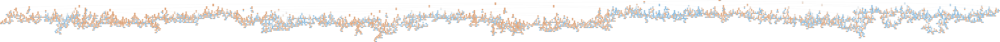

In [27]:
# As before, but make the model name gini_model
dot_data = StringIO()
tree.export_graphviz(gini_model , out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["NO", "YES"])

# Alternatively for class_names use gini_model.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [28]:
# Run this block for model evaluation
print("Model Gini impurity model")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score' , metrics.precision_score(y_test,y_pred, pos_label = 1))
print('Recall score' , metrics.recall_score(y_test,y_pred, pos_label = 0))

Model Gini impurity model
Accuracy: 0.8754313014244006
Balanced accuracy: 0.7003048406698082
Precision score 0.4526472781506339
Recall score 0.9267611255238475


# Model 3: Entropy model - max depth 3

In [29]:
# Made a model as before, but call it entr_model2, and make the max_depth parameter equal to 3. 
# Execute the fitting, predicting, and Series operations as before
entr_model2 = tree.DecisionTreeClassifier(criterion="entropy", max_depth=3, random_state=1234)

# Fit the entr_model2
entr_model2.fit(X_train, y_train)

# Make predictions using entr_model2
y_pred = entr_model2.predict(X_test)

# Convert y_pred to a series
y_pred = pd.Series(y_pred)

# Check the entr_model2
entr_model2

DecisionTreeClassifier(criterion='entropy', max_depth=3, random_state=1234)

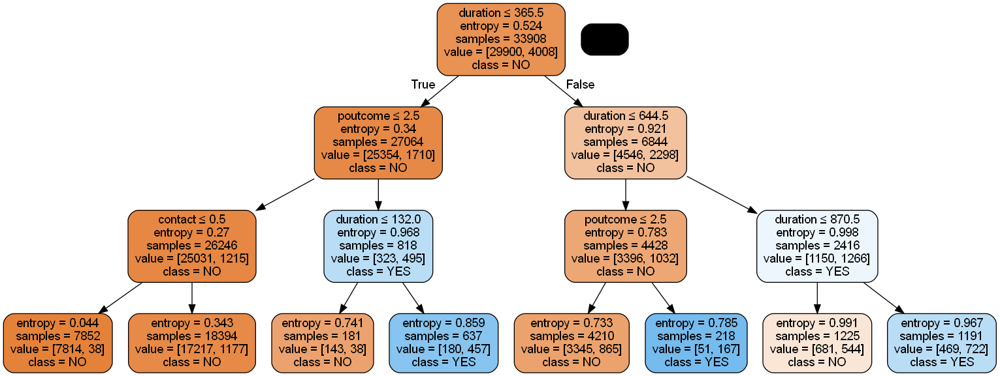

In [30]:
# As before, we need to visualize the tree to grasp its nature
dot_data = StringIO()
tree.export_graphviz(entr_model2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["NO", "YES"])

# Alternatively for class_names use entr_model2.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [31]:
# Run this block for model evaluation 
print("Model Entropy model max depth 3")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score for "Yes"' , metrics.precision_score(y_test,y_pred, pos_label = 1))
print('Recall score for "No"' , metrics.recall_score(y_test,y_pred, pos_label = 0))

Model Entropy model max depth 3
Accuracy: 0.8986994603202689
Balanced accuracy: 0.6412548521278169
Precision score for "Yes" 0.6039755351681957
Recall score for "No" 0.9741568549191778


# Model 4: Gini impurity model - max depth 3

In [32]:
# Create the gini_model2 with criterion='gini' and max_depth=3
gini_model2 = tree.DecisionTreeClassifier(criterion='gini', random_state=1234, max_depth=3)

# Fit the gini_model2
gini_model2.fit(X_train, y_train)

# Make predictions using gini_model2
y_pred = gini_model2.predict(X_test)

# Convert y_pred to a series
y_pred = pd.Series(y_pred)

# Check the gini_model2
gini_model2

DecisionTreeClassifier(max_depth=3, random_state=1234)

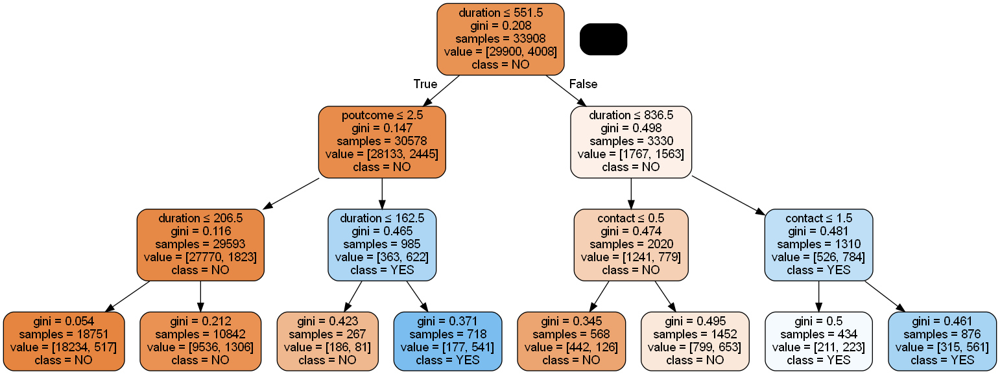

In [33]:
dot_data = StringIO()
tree.export_graphviz(gini_model2, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True, feature_names=X_train.columns,class_names = ["NO", "YES"])

# Alternatively for class_names use gini_model2.classes_
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
Image(graph.create_png())

In [34]:
print("Gini impurity  model - max depth 3")
print("Accuracy:", metrics.accuracy_score(y_test,y_pred))
print("Balanced accuracy:", metrics.balanced_accuracy_score(y_test,y_pred))
print('Precision score' , metrics.precision_score(y_test,y_pred, pos_label = 1))
print('Recall score' , metrics.recall_score(y_test,y_pred, pos_label = 0))

Gini impurity  model - max depth 3
Accuracy: 0.8979032115367601
Balanced accuracy: 0.6397845504916506
Precision score 0.5966514459665144
Recall score 0.9735581720215526


# Project Conclusion
This project evaluated multiple decision tree models on a banking dataset to predict whether a client would subscribe to a term deposit. We tested four different models with varying criteria and maximum depths to compare their performances:

## Model 1: Entropy Model (No Max Depth)

Accuracy: 87.7%
Balanced Accuracy: 70.4%
Precision for Label 1 (Subscribed): 45.9%
Recall for Label 1: 48.0%
Precision for Label 0 (Not Subscribed): 93.3%
Recall for Label 0: 92.8%
This model performs reasonably well with high accuracy, but the balanced accuracy indicates that it may not handle class imbalance effectively. Precision and recall scores for label 1 (subscribed) are low, meaning it struggles to accurately predict the minority class.

## Model 2: Gini Model (No Max Depth)

Accuracy: 87.5%
Balanced Accuracy: 70.0%
Precision for Label 1: 45.3%
Recall for Label 1: 92.7%
Similar to the entropy model with no max depth, this model shows high accuracy but struggles with the minority class. Precision for label 1 is low, and balanced accuracy is slightly lower than the entropy model, suggesting minor underperformance with class imbalance.

## Model 3: Entropy Model (Max Depth 3)

Accuracy: 89.9%
Balanced Accuracy: 64.1%
Precision for Label 1: 60.4%
Recall for Label 0: 97.4%
Setting a maximum depth of 3 for this model improved the precision for label 1 but reduced the balanced accuracy, indicating a trade-off between complexity and the model's ability to capture minority class instances. The high recall score for label 0 (not subscribed) suggests this model is biased toward the majority class.

## Model 4: Gini Model (Max Depth 3)

Accuracy: 89.8%
Balanced Accuracy: 63.9%
Precision for Label 1: 59.7%
Recall for Label 0: 97.4%
Similar to the entropy model with a max depth of 3, this model demonstrates a high accuracy but relatively low balanced accuracy. The precision and recall patterns align closely with Model 3, indicating both models with limited depth behave similarly across class imbalance issues.

Key Takeaways
High Accuracy but Lower Balanced Accuracy: All models show high overall accuracy, but the lower balanced accuracy reveals limitations in handling class imbalance effectively. This means the models tend to predict the majority class (not subscribed) more accurately than the minority class (subscribed).

Performance of Label 1 (Subscribed): Models without max depth show very low precision and recall for label 1, indicating difficulty in predicting the minority class. Restricting the depth improved precision for label 1, but at the cost of balanced accuracy, highlighting a trade-off between complexity and performance on imbalanced data.

Best Model for Interpretation: Models with limited depth (3) are easier to interpret and show improved precision for the minority class, making them potentially more suitable if interpretability is a priority.

## Conclusion
In conclusion, while all models demonstrated good accuracy, the models with max depth (Models 3 and 4) struck a better balance in terms of precision for the subscribed class, making them more effective at capturing the minority class without being overly complex. However, class imbalance remains a challenge, and addressing this could lead to more robust predictions. For deployment, a model with a max depth of 3 may offer a practical trade-off between interpretability and performance.